In [1]:
import os
from os import mkdir

In [2]:
!mkdir '/content/dogs_dataset'

In [3]:
!mkdir '/content/dogs_dataset/images'

In [4]:
!gdown https://drive.google.com/uc?id=1zlZ9_XZjf4z176jHjuUeP99vm3IRIt9d

Downloading...
From: https://drive.google.com/uc?id=1zlZ9_XZjf4z176jHjuUeP99vm3IRIt9d
To: /content/images.zip
100% 105M/105M [00:00<00:00, 143MB/s]


In [5]:
!unzip images.zip -d '/content/dogs_dataset/images'

Streaming output truncated to the last 5000 lines.
  inflating: /content/dogs_dataset/images/dog_26_4.png  
  inflating: /content/dogs_dataset/images/dog_60_65.png  
  inflating: /content/dogs_dataset/images/dog_85_25.png  
  inflating: /content/dogs_dataset/images/dog_90_91.png  
  inflating: /content/dogs_dataset/images/dog_89_86.png  
  inflating: /content/dogs_dataset/images/dog_50_51.png  
  inflating: /content/dogs_dataset/images/dog_67_99.png  
  inflating: /content/dogs_dataset/images/dog_80_34.png  
  inflating: /content/dogs_dataset/images/dog_43_51.png  
  inflating: /content/dogs_dataset/images/dog_55_61.png  
  inflating: /content/dogs_dataset/images/dog_64_54.png  
  inflating: /content/dogs_dataset/images/dog_62_24.png  
  inflating: /content/dogs_dataset/images/dog_21_39.png  
  inflating: /content/dogs_dataset/images/dog_97_88.png  
  inflating: /content/dogs_dataset/images/dog_3_39.png  
  inflating: /content/dogs_dataset/images/dog_86_99.png  
  inflating: /content/d

In [6]:
import os
data_dir = '/content/dogs_dataset'
print(os.listdir(data_dir))

['images']


In [7]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [8]:
image_size = 64
batch_size = 128
stats = (0.5,0.5,0.5),(0.5,0.5,0.5)

In [9]:
train_ds = ImageFolder(data_dir, transform = T.Compose([T.Resize(image_size),
                                                        T.CenterCrop(image_size),
                                                        T.ToTensor(),
                                                        T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle = True, num_workers = 3, pin_memory = True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [10]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [11]:
def denorm(img_tensors):
  return img_tensors * stats[1][0] + stats[0][0]

In [12]:
def show_images(images, nmax= 64):
  fig,ax = plt.subplots(figsize = (8,8))
  ax.set_xticks([]); ax.set_yticks([])
  ax.imshow(make_grid(denorm(images.detach()[:nmax]),nrow = 8).permute(1,2,0))

def show_batch(dl, nmax = 64):
  for images,_ in dl:
    show_images(images,nmax)
    break

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


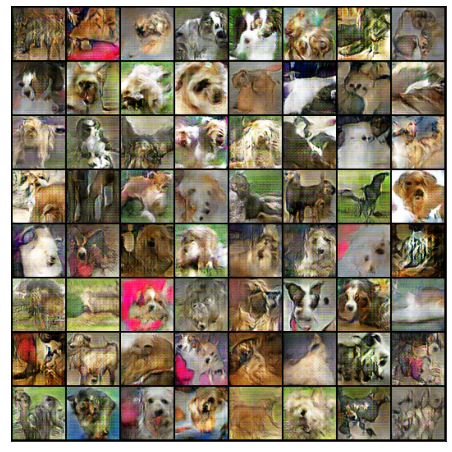

In [13]:
show_batch(train_dl)

In [14]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [15]:
device = get_default_device()
device

device(type='cuda')

In [16]:
train_dl = DeviceDataLoader(train_dl,device)

In [17]:
# now all the preprocesisng has completed
# Time to go to model

In [18]:
#Discriminator Network

In [19]:
import torch.nn as nn

In [20]:
discriminator = nn.Sequential(
    #input: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace = True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(128),    
    nn.LeakyReLU(0.2,inplace = True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(256),    
    nn.LeakyReLU(0.2,inplace = True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size = 4, stride = 2, padding = 1, bias = False),
    nn.BatchNorm2d(512),    
    nn.LeakyReLU(0.2,inplace = True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size = 4, stride = 1, padding = 0, bias = False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [21]:
discriminator = to_device(discriminator, device)

In [22]:
## Generator Network

In [23]:
latent_size = 128

In [24]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


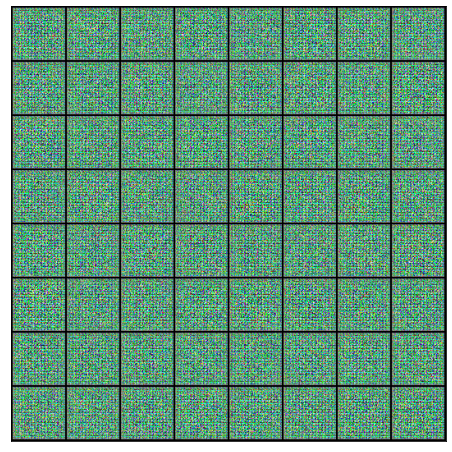

In [25]:
xb = torch.randn(batch_size,latent_size,1,1)
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [26]:
generator = to_device(generator,device)

In [27]:
torch.ones(2)

tensor([1., 1.])

In [28]:
torch.ones(2,1)

tensor([[1.],
        [1.]])

In [29]:
import torch.nn.functional as F

In [30]:
def train_discriminator(real_images,opt_d):
  # clear discriminator weights
  opt_d.zero_grad()

  # Pass real images to discriminator
  real_preds = discriminator(real_images)
  real_targets = torch.ones(real_images.size(0),1,device = device)
  real_loss = F.binary_cross_entropy(real_preds, real_targets)
  real_score = torch.mean(real_preds).item()

  # generate fake images
  latent = torch.randn(batch_size,latent_size,1,1,device = device)
  fake_images = generator(latent)

  # pass fake images through discriminator
  fake_preds = discriminator(fake_images)
  fake_targets = torch.zeros(fake_images.size(0),1,device = device)
  fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
  fake_score = torch.mean(fake_preds).item()

  # update discriminator weights
  loss = real_loss + fake_loss
  loss.backward()
  opt_d.step()
  return loss.item(), real_score, fake_score

In [31]:
def train_generator(opt_g):

  # clear generator weights
  opt_g.zero_grad()

  # generate fake images
  latent = torch.randn(batch_size,latent_size,1,1,device = device)
  images = generator(latent)

  # compute loss
  preds = discriminator(images)
  targets = torch.ones(images.size(0),1,device = device)
  loss = F.binary_cross_entropy(preds,targets)

  # update weights
  loss.backward()
  opt_g.step()
  return loss.item()

In [32]:
from torchvision.utils import save_image

In [33]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok = True)

In [34]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [35]:
fixed_latent = torch.randn(64,latent_size,1,1,device = device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


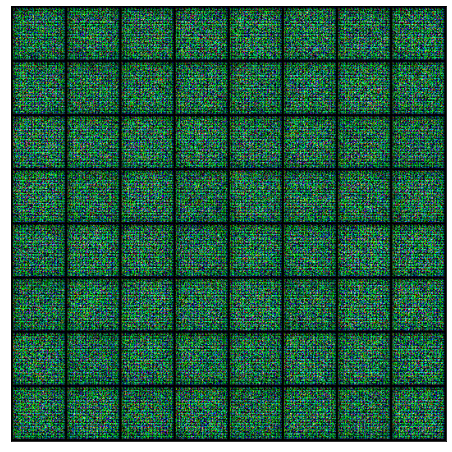

In [36]:
save_samples(0,fixed_latent)

In [37]:
from tqdm.notebook import tqdm

In [38]:
def fit(epochs, lr, start_idx=1):
  torch.cuda.empty_cache()

  # losses and scores
  losses_g = []
  losses_d = []
  real_scores = []
  fake_scores = []

  # optimizers
  opt_d = torch.optim.Adam(discriminator.parameters(),lr = lr,betas = (0.5,0.999))
  opt_g = torch.optim.Adam(generator.parameters(), lr = lr, betas = (0.5,0.999))

  for epoch in range(epochs):
    for real_images,_ in tqdm(train_dl):
      # Train discriminator
      loss_d, real_score, fake_score = train_discriminator(real_images,opt_d)
      # Train generator
      loss_g = train_generator(opt_g)

    # Record losses and scores
    losses_g.append(loss_g)
    losses_d.append(loss_g)
    real_scores.append(real_score)
    fake_scores.append(fake_score)

    print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
    # save generated images
    save_samples(epoch+start_idx, fixed_latent, show = False)

  return losses_g, losses_d, real_scores, fake_scores



In [39]:
lr = 0.0005
epochs = 25

In [40]:
history = fit(epochs,lr)

  0%|          | 0/79 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch [1/25], loss_g: 3.0973, loss_d: 1.3793, real_score: 0.3036, fake_score: 0.0259
Saving generated-images-0001.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [2/25], loss_g: 3.1123, loss_d: 1.3578, real_score: 0.8224, fake_score: 0.6334
Saving generated-images-0002.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [3/25], loss_g: 2.7331, loss_d: 0.6625, real_score: 0.8138, fake_score: 0.3318
Saving generated-images-0003.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [4/25], loss_g: 0.7576, loss_d: 0.9167, real_score: 0.5286, fake_score: 0.1906
Saving generated-images-0004.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [5/25], loss_g: 3.3278, loss_d: 0.8549, real_score: 0.5313, fake_score: 0.0522
Saving generated-images-0005.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [6/25], loss_g: 2.8804, loss_d: 1.3139, real_score: 0.7216, fake_score: 0.5409
Saving generated-images-0006.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [7/25], loss_g: 4.6276, loss_d: 0.9499, real_score: 0.7678, fake_score: 0.4513
Saving generated-images-0007.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [8/25], loss_g: 2.3614, loss_d: 1.0291, real_score: 0.4655, fake_score: 0.0695
Saving generated-images-0008.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [9/25], loss_g: 6.5211, loss_d: 1.4131, real_score: 0.8289, fake_score: 0.6586
Saving generated-images-0009.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [10/25], loss_g: 4.4301, loss_d: 1.3207, real_score: 0.8412, fake_score: 0.6099
Saving generated-images-0010.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [11/25], loss_g: 2.4352, loss_d: 1.2214, real_score: 0.4657, fake_score: 0.3050
Saving generated-images-0011.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [12/25], loss_g: 3.8272, loss_d: 0.9779, real_score: 0.7570, fake_score: 0.4339
Saving generated-images-0012.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [13/25], loss_g: 3.9924, loss_d: 0.8130, real_score: 0.7494, fake_score: 0.3605
Saving generated-images-0013.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [14/25], loss_g: 4.3355, loss_d: 0.7123, real_score: 0.7694, fake_score: 0.3278
Saving generated-images-0014.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [15/25], loss_g: 5.6871, loss_d: 0.9493, real_score: 0.8497, fake_score: 0.4728
Saving generated-images-0015.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [16/25], loss_g: 3.3250, loss_d: 0.4190, real_score: 0.8027, fake_score: 0.1440
Saving generated-images-0016.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [17/25], loss_g: 7.2427, loss_d: 1.0763, real_score: 0.8852, fake_score: 0.5506
Saving generated-images-0017.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [18/25], loss_g: 5.0830, loss_d: 0.2552, real_score: 0.9182, fake_score: 0.1468
Saving generated-images-0018.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [19/25], loss_g: 5.6755, loss_d: 0.6096, real_score: 0.9444, fake_score: 0.3823
Saving generated-images-0019.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [20/25], loss_g: 5.1552, loss_d: 0.5492, real_score: 0.9350, fake_score: 0.3427
Saving generated-images-0020.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [21/25], loss_g: 5.3772, loss_d: 0.8963, real_score: 0.8772, fake_score: 0.4644
Saving generated-images-0021.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [22/25], loss_g: 1.8846, loss_d: 0.8322, real_score: 0.5193, fake_score: 0.0473
Saving generated-images-0022.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [23/25], loss_g: 1.8257, loss_d: 0.8132, real_score: 0.5960, fake_score: 0.1545
Saving generated-images-0023.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [24/25], loss_g: 4.2283, loss_d: 0.6263, real_score: 0.7900, fake_score: 0.2859
Saving generated-images-0024.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [25/25], loss_g: 3.6940, loss_d: 0.3951, real_score: 0.8211, fake_score: 0.1244
Saving generated-images-0025.png


In [41]:
losses_g, losses_d, real_scores, fake_scores = history

In [42]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [43]:
from IPython.display import Image

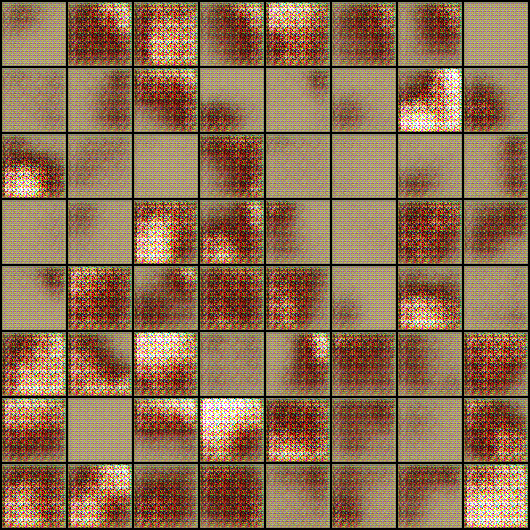

In [44]:
Image('./generated/generated-images-0001.png')

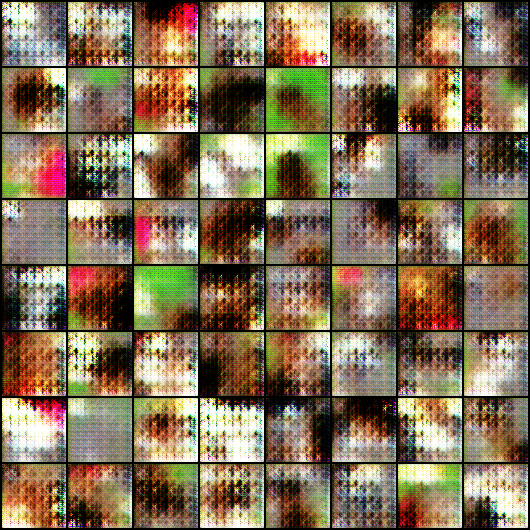

In [45]:
Image('./generated/generated-images-0005.png')

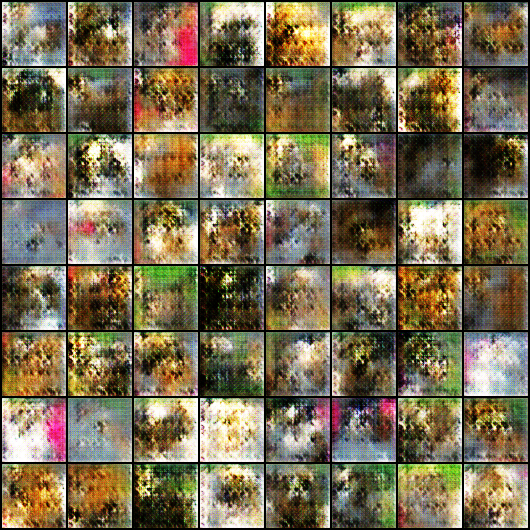

In [46]:
Image('./generated/generated-images-0010.png')

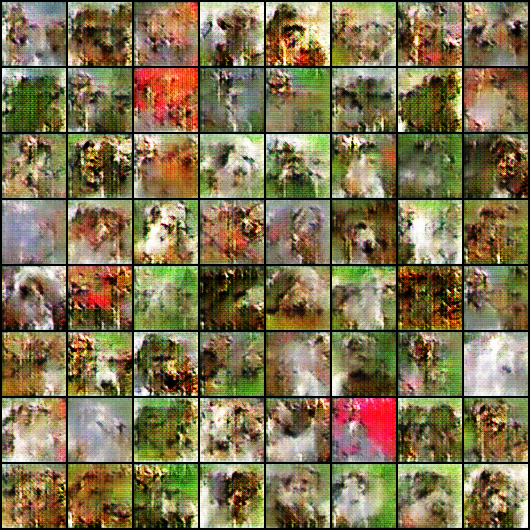

In [47]:
Image('./generated/generated-images-0015.png')

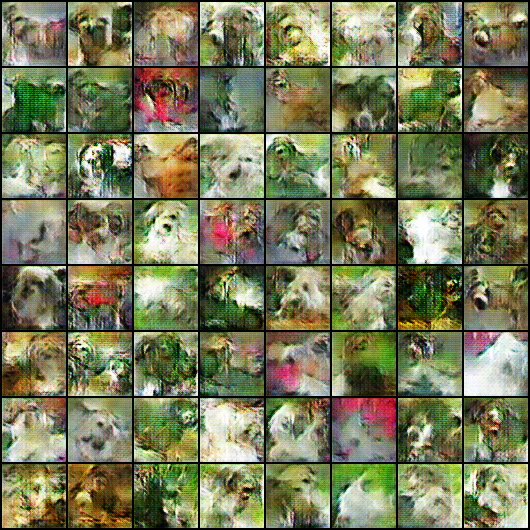

In [48]:
Image('./generated/generated-images-0020.png')

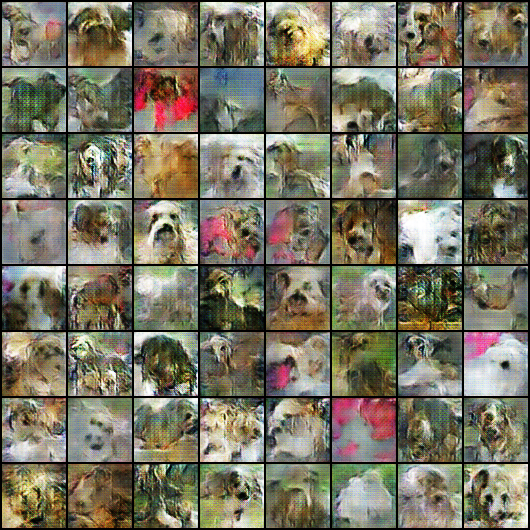

In [49]:
Image('./generated/generated-images-0025.png')

In [50]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

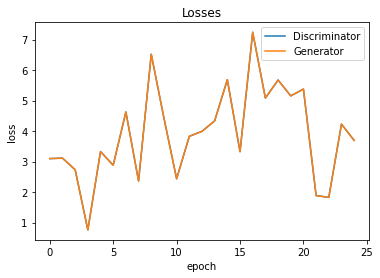

In [51]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

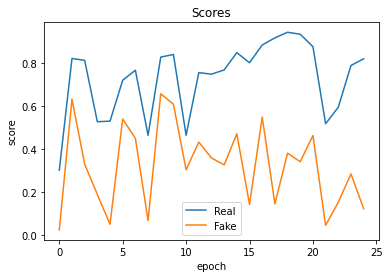

In [52]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

In [53]:
lr = 0.001
epochs = 25

In [54]:
history2 = fit(epochs,lr,start_idx = 25)

  0%|          | 0/79 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch [1/25], loss_g: 5.0949, loss_d: 0.9532, real_score: 0.8064, fake_score: 0.4335
Saving generated-images-0025.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [2/25], loss_g: 2.4104, loss_d: 1.1128, real_score: 0.4058, fake_score: 0.0520
Saving generated-images-0026.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [3/25], loss_g: 2.3847, loss_d: 1.0542, real_score: 0.4596, fake_score: 0.0483
Saving generated-images-0027.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [4/25], loss_g: 3.9301, loss_d: 0.7972, real_score: 0.8996, fake_score: 0.4353
Saving generated-images-0028.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [5/25], loss_g: 1.3897, loss_d: 1.2313, real_score: 0.3986, fake_score: 0.0905
Saving generated-images-0029.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [6/25], loss_g: 3.1371, loss_d: 0.7461, real_score: 0.7255, fake_score: 0.2862
Saving generated-images-0030.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [7/25], loss_g: 2.3585, loss_d: 1.0610, real_score: 0.4133, fake_score: 0.0167
Saving generated-images-0031.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [8/25], loss_g: 1.0380, loss_d: 1.0731, real_score: 0.4756, fake_score: 0.1480
Saving generated-images-0032.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [9/25], loss_g: 2.3069, loss_d: 0.7895, real_score: 0.5544, fake_score: 0.0926
Saving generated-images-0033.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [10/25], loss_g: 4.4882, loss_d: 0.8152, real_score: 0.9419, fake_score: 0.4591
Saving generated-images-0034.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [11/25], loss_g: 1.5409, loss_d: 1.3535, real_score: 0.4012, fake_score: 0.0517
Saving generated-images-0035.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [12/25], loss_g: 4.1715, loss_d: 0.9105, real_score: 0.9089, fake_score: 0.4957
Saving generated-images-0036.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [13/25], loss_g: 1.7768, loss_d: 1.4522, real_score: 0.3238, fake_score: 0.0174
Saving generated-images-0037.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [14/25], loss_g: 1.1629, loss_d: 1.8544, real_score: 0.2094, fake_score: 0.0211
Saving generated-images-0038.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [15/25], loss_g: 5.1640, loss_d: 0.9755, real_score: 0.9406, fake_score: 0.5370
Saving generated-images-0039.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [16/25], loss_g: 5.2178, loss_d: 0.8316, real_score: 0.9816, fake_score: 0.4773
Saving generated-images-0040.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [17/25], loss_g: 3.9935, loss_d: 0.6017, real_score: 0.8134, fake_score: 0.2518
Saving generated-images-0041.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [18/25], loss_g: 2.4244, loss_d: 0.6641, real_score: 0.6039, fake_score: 0.0872
Saving generated-images-0042.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [19/25], loss_g: 0.9039, loss_d: 1.0581, real_score: 0.4738, fake_score: 0.0595
Saving generated-images-0043.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [20/25], loss_g: 2.1157, loss_d: 0.6070, real_score: 0.7024, fake_score: 0.1545
Saving generated-images-0044.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [21/25], loss_g: 1.9048, loss_d: 0.6919, real_score: 0.6736, fake_score: 0.1769
Saving generated-images-0045.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [22/25], loss_g: 2.3469, loss_d: 0.7062, real_score: 0.7337, fake_score: 0.2600
Saving generated-images-0046.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [23/25], loss_g: 2.9491, loss_d: 0.4083, real_score: 0.7319, fake_score: 0.0619
Saving generated-images-0047.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [24/25], loss_g: 4.4232, loss_d: 0.7226, real_score: 0.9578, fake_score: 0.4252
Saving generated-images-0048.png


  0%|          | 0/79 [00:00<?, ?it/s]

Epoch [25/25], loss_g: 7.2782, loss_d: 1.7605, real_score: 0.9936, fake_score: 0.7202
Saving generated-images-0049.png


In [55]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

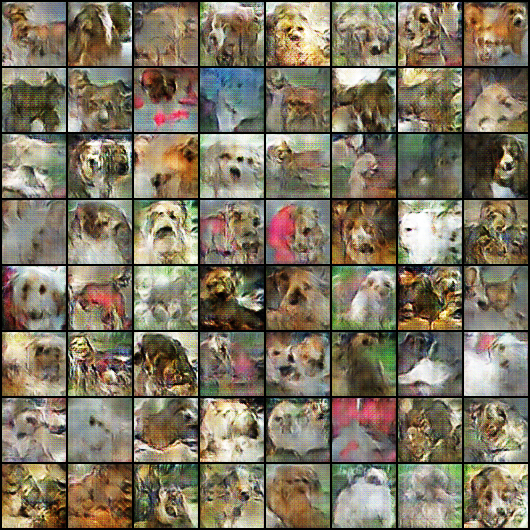

In [56]:
Image('./generated/generated-images-0030.png')

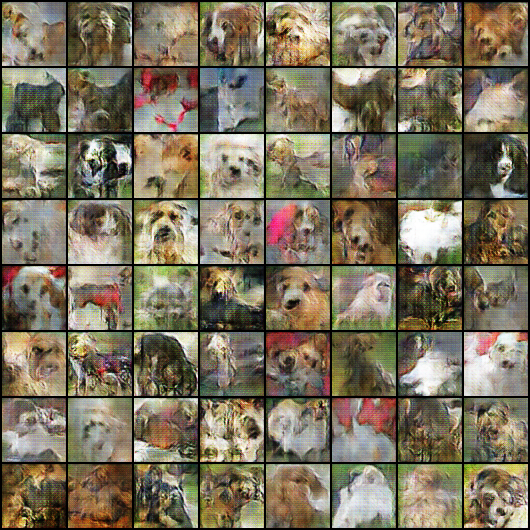

In [57]:
Image('./generated/generated-images-0035.png')

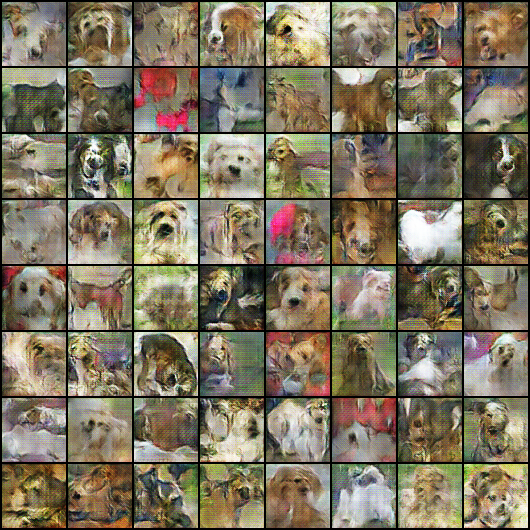

In [58]:
Image('./generated/generated-images-0040.png')

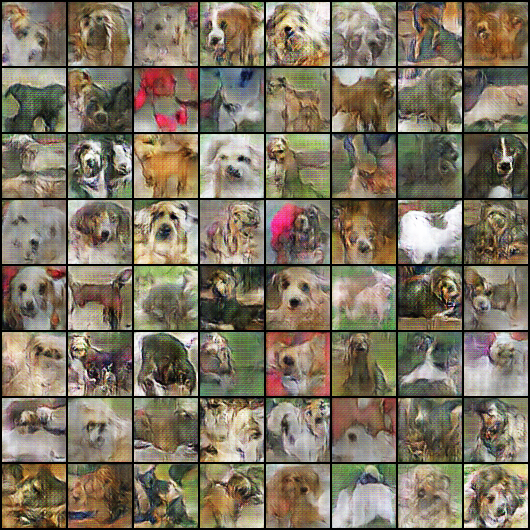

In [59]:
Image('./generated/generated-images-0045.png')

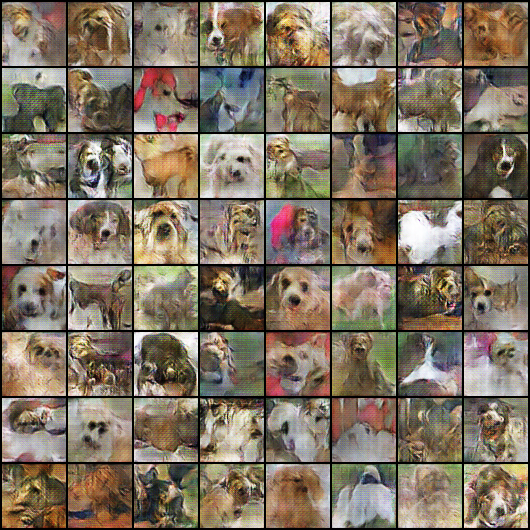

In [60]:
Image('./generated/generated-images-0048.png')

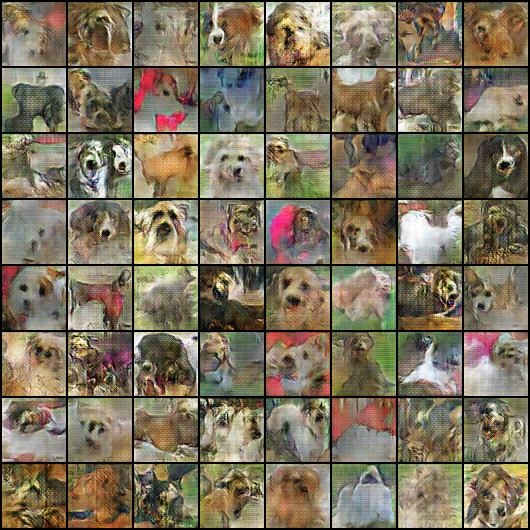

In [61]:
Image('./generated/generated-images-0049.png')

In [62]:
train_ds = ImageFolder(data_dir, transform = T.Compose([T.Resize(image_size),
                                                        T.CenterCrop(image_size),
                                                        T.ToTensor(),
                                                        T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle = True, num_workers = 3, pin_memory = True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


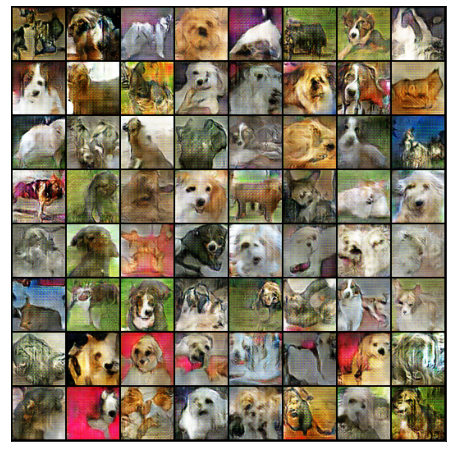

In [63]:
show_batch(train_dl)